In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import sklearn
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import time
from IPython.display import display
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from collections import defaultdict, Counter
from sklearn.metrics import adjusted_mutual_info_score, accuracy_score, homogeneity_score, silhouette_score,adjusted_rand_score,completeness_score,v_measure_score,fowlkes_mallows_score
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
import sys
import warnings
from sklearn.decomposition import FastICA
from sklearn.mixture import GaussianMixture as GMM
from sklearn.decomposition import PCA
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer,SilhouetteVisualizer,InterclusterDistance
from sklearn.datasets import make_blobs
from scipy.stats import norm, kurtosis
#from silhouette import silhouette
from itertools import product
from sklearn.random_projection import SparseRandomProjection as RCA
import scipy.sparse as sps
from scipy.linalg import pinv
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestClassifier
from sklearn.random_projection import GaussianRandomProjection
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
matplotlib.rc('figure', figsize=[10,5])

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [3]:
%cd /content/drive/My Drive/Colab Notebooks/
sat = pd.read_csv('Satisfaction.csv')

/content/drive/My Drive/Colab Notebooks


# Pre-process

In [4]:
sat.isnull().sum()

Unnamed: 0                            0
id                                    0
Gender                                0
Customer_Type                         0
Age                                   0
Type_of_Travel                        0
Class                                 0
Flight_Distance                       0
Inflight_wifi_service                 0
Departure_Arrival_time_convenient     0
Ease_of_Online_booking                0
Gate_location                         0
Food_and_drink                        0
Online_boarding                       0
Seat_comfort                          0
Inflight_entertainment                0
On_board_service                      0
Leg_room_service                      0
Baggage_handling                      0
Checkin_service                       0
Inflight_service                      0
Cleanliness                           0
Departure_Delay_in_Minutes            0
Arrival_Delay_in_Minutes             83
satisfaction                          0


In [5]:
sat.dropna(inplace=True)

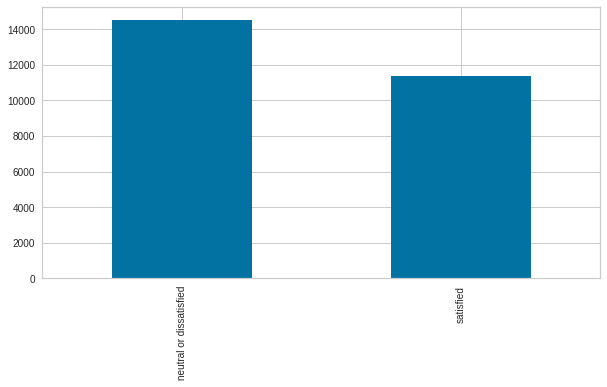

In [6]:
sat['satisfaction'].value_counts().plot(kind='bar')

In [7]:
sat['satisfaction'] = sat['satisfaction'].map({'neutral or dissatisfied': 0,'satisfied': 1})

Random under-sampling:
1    11365
0    11365
Name: satisfaction, dtype: int64


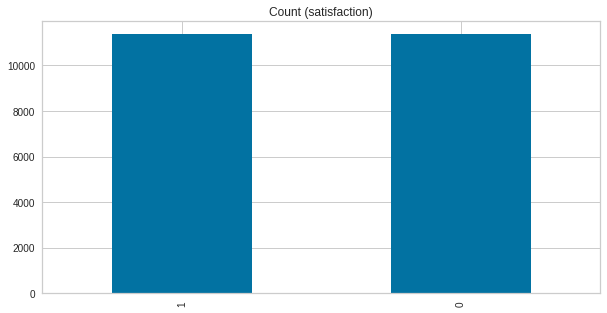

In [8]:
count_class_0, count_class_1 = sat['satisfaction'].value_counts()
class_0 = sat[sat['satisfaction'] == 0]
class_1 = sat[sat['satisfaction'] == 1]

class_0_under = class_0.sample(count_class_1, random_state = 7)

data_under = pd.concat([class_0_under, class_1], axis=0)

print('Random under-sampling:')
print(data_under.satisfaction.value_counts())

data_under.satisfaction.value_counts().plot(kind='bar', title='Count (satisfaction)')

In [9]:
data_under.head()

,Unnamed: 0,id,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure_Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On_board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
5327,5327,35266,Female,Loyal Customer,25,Business travel,Business,3056,3,5,5,5,3,3,3,3,3,4,3,2,4,3,15,47.0,0
21395,21395,127477,Female,Loyal Customer,46,Business travel,Eco,2075,4,1,1,1,1,3,4,4,4,4,4,2,4,3,2,0.0,0
5443,5443,116154,Male,Loyal Customer,64,Personal Travel,Eco,446,4,5,4,4,1,4,2,1,3,3,5,3,4,1,32,29.0,0
11953,11953,62361,Female,Loyal Customer,65,Personal Travel,Eco,1589,2,4,2,1,5,5,5,1,1,2,1,5,1,4,0,4.0,0
6649,6649,81128,Female,Loyal Customer,57,Personal Travel,Eco,991,4,2,4,4,2,4,3,5,5,4,5,2,5,2,4,0.0,0


In [10]:
data_under = data_under.drop(columns = ['Unnamed: 0','id','Gender','Customer_Type','Type_of_Travel','Class',
                                        #'','','','',''
                                       ])

In [11]:
data_under.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22730 entries, 5327 to 25974
Data columns (total 19 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                22730 non-null  int64  
 1   Flight_Distance                    22730 non-null  int64  
 2   Inflight_wifi_service              22730 non-null  int64  
 3   Departure_Arrival_time_convenient  22730 non-null  int64  
 4   Ease_of_Online_booking             22730 non-null  int64  
 5   Gate_location                      22730 non-null  int64  
 6   Food_and_drink                     22730 non-null  int64  
 7   Online_boarding                    22730 non-null  int64  
 8   Seat_comfort                       22730 non-null  int64  
 9   Inflight_entertainment             22730 non-null  int64  
 10  On_board_service                   22730 non-null  int64  
 11  Leg_room_service                   22730 non-null  

In [12]:
data_under.head()

,Age,Flight_Distance,Inflight_wifi_service,Departure_Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On_board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
5327,25,3056,3,5,5,5,3,3,3,3,3,4,3,2,4,3,15,47.0,0
21395,46,2075,4,1,1,1,1,3,4,4,4,4,4,2,4,3,2,0.0,0
5443,64,446,4,5,4,4,1,4,2,1,3,3,5,3,4,1,32,29.0,0
11953,65,1589,2,4,2,1,5,5,5,1,1,2,1,5,1,4,0,4.0,0
6649,57,991,4,2,4,4,2,4,3,5,5,4,5,2,5,2,4,0.0,0


In [13]:
X = data_under.drop('satisfaction', axis=1)
y = data_under["satisfaction"]
X_train_n, X_test_n, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 7)

minMaxNorm = MinMaxScaler()
X_train = minMaxNorm.fit_transform(X_train_n)
X_test = minMaxNorm.fit_transform(X_test_n)

In [14]:
X_train.shape

(15911, 18)

In [15]:
LABELS = ['Age', 
       'Flight_Distance', 'Inflight_wifi_service',
       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
        ]

# K-means

## Elbow

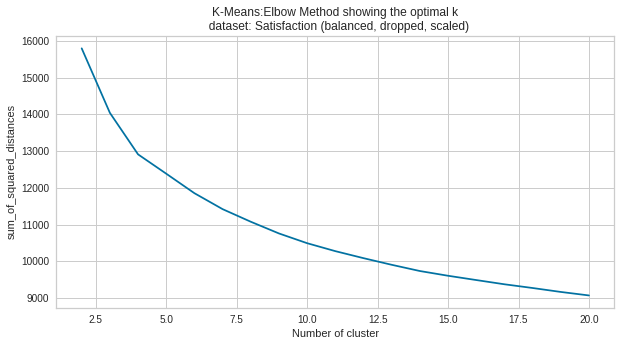

In [ ]:
sse = {}
clust_range = list(range(2,21,1))
for cluster_size in clust_range:
    kmeans = KMeans(n_clusters=cluster_size, max_iter=10000, random_state=7).fit(X_train)
    sse [cluster_size] = kmeans.inertia_
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), 'bx-')
plt.xlabel("Number of cluster")
plt.ylabel('sum_of_squared_distances')
plt.title('K-Means:Elbow Method showing the optimal k\n  dataset: Satisfaction (balanced, dropped, scaled)')
plt.show()

# Metrics

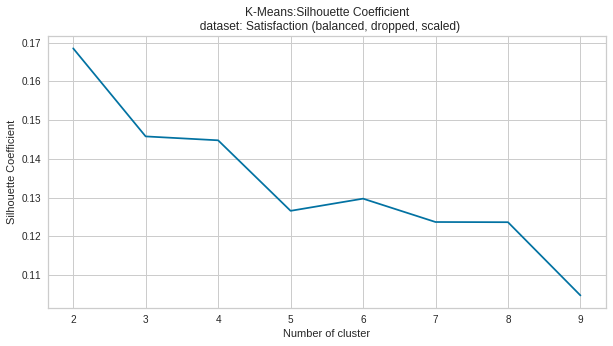

In [ ]:
silh = {}
homog = {}
for cluster_size in range(2,10):
    kmeans = KMeans(n_clusters=cluster_size, max_iter=10000, random_state=7).fit(X_train)
    label = kmeans.labels_
    sil_coeff = silhouette_score(X_train, label, metric='euclidean')
    homog_score = homogeneity_score(y_train, label)
    silh[cluster_size] = sil_coeff
    homog[cluster_size] = homog_score
plt.figure()
plt.plot(list(silh.keys()), list(silh.values()),'bx-' )
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Coefficient")
plt.title('K-Means:Silhouette Coefficient\n  dataset: Satisfaction (balanced, dropped, scaled)')
plt.show()

In [ ]:
def get_kmean_scores(X, y, N):


    def get_kmean(n):
        km = KMeans(n_clusters=n,random_state=7, max_iter=10000)
        km.fit(X)
        km_labels = km.predict(X)
        
        hom = homogeneity_score(y, km_labels)
        ami = adjusted_mutual_info_score(y,km_labels)
        rand = adjusted_rand_score(y,km_labels)
        comple = completeness_score(y,km_labels)
        vmeasure = v_measure_score(y,km_labels)
        fowm = fowlkes_mallows_score(y, km_labels)
        
        
        return hom, ami, rand, comple, vmeasure, fowm 
    
  
    
    n_rng = np.arange(2,N+1)
    scores_df = pd.DataFrame()

    for n in n_rng:
        results = {'n':n}
        hom, ami, rand, comple, vmeasure, fowm  = get_kmean(n)            
        results[f"hom"] = hom; results[f"ami"] = ami; results[ f"rand"] = rand; results[f"comple"] = comple; results[f"vmeasure"] = vmeasure; results[f"fowm"] = fowm 
        print(f" done with N: {n}")
        
        scores_df = scores_df.append(results, ignore_index=True)
            

    return scores_df

In [ ]:
def plot_elbow_kmeans(k_metric_df, name='dsname'):
    
    #fig = plt.figure(figsize=[2,3])

    plt.figure()
    
    x_vals = k_metric_df['n'].values
    x_vals = x_vals.astype('int32')
    
    plt.plot(x_vals, k_metric_df['hom'], label="Homogeneity")
    plt.plot(x_vals, k_metric_df['ami'], label="AMI")
    plt.plot(x_vals, k_metric_df['rand'], label="Rand index")
    plt.plot(x_vals, k_metric_df['comple'], label="Completeness")
    plt.plot(x_vals, k_metric_df['vmeasure'], label="V-measure")
    plt.plot(x_vals, k_metric_df['fowm'], label="Fowlkes-Mallows")

    plt.legend()
    plt.xlabel("Number of cluster")
    plt.ylabel("scores")
    plt.title('K-Means:other performance evaluation\n dataset: %s '%name)
    plt.show()

In [ ]:
scores_df = get_kmean_scores(X_train, y_train, 10)

 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10


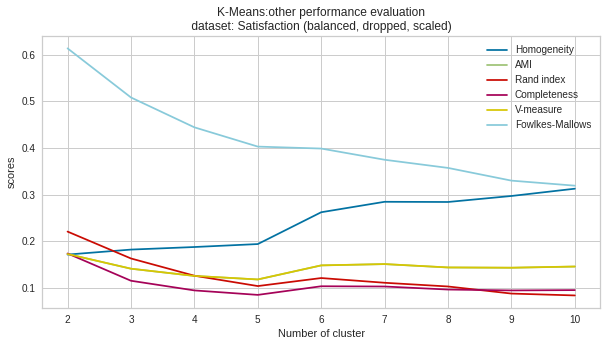

In [ ]:
plot_elbow_kmeans(scores_df, 'Satisfaction (balanced, dropped, scaled)')

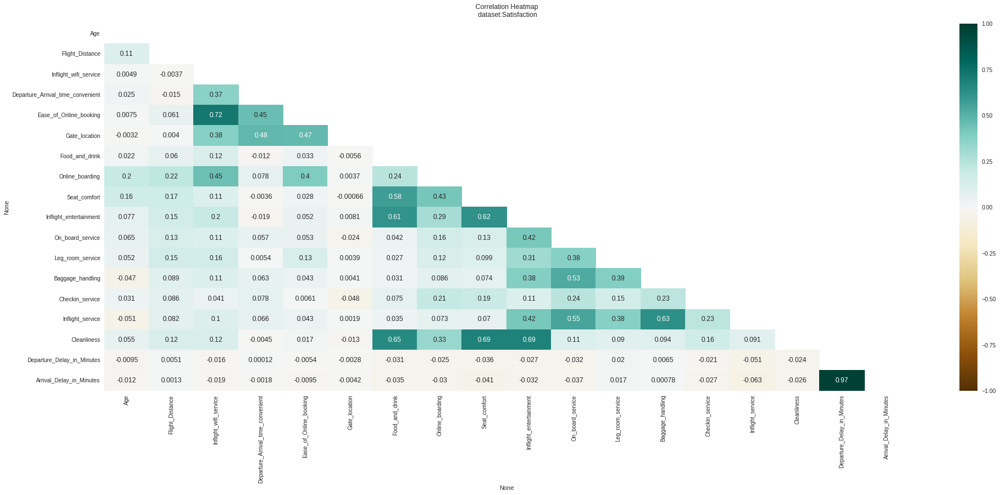

In [ ]:
##Point Biserial Correlation
from scipy import stats
pair_corr = pd.DataFrame(X_train, columns=[LABELS])


num_corr=pair_corr.corr()
plt.figure(figsize=(32, 12))
mask = np.triu(np.ones_like(num_corr, dtype=np.bool))
num_heatmap = sns.heatmap(num_corr, mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
num_heatmap.set_title('Correlation Heatmap\n dataset:Satisfaction', fontdict={'fontsize':12}, pad=12);

Text(0.5, 1.08, 'Kmeans: pairwise plotting, k-cluster = 3\n dataset: Satisfaction')

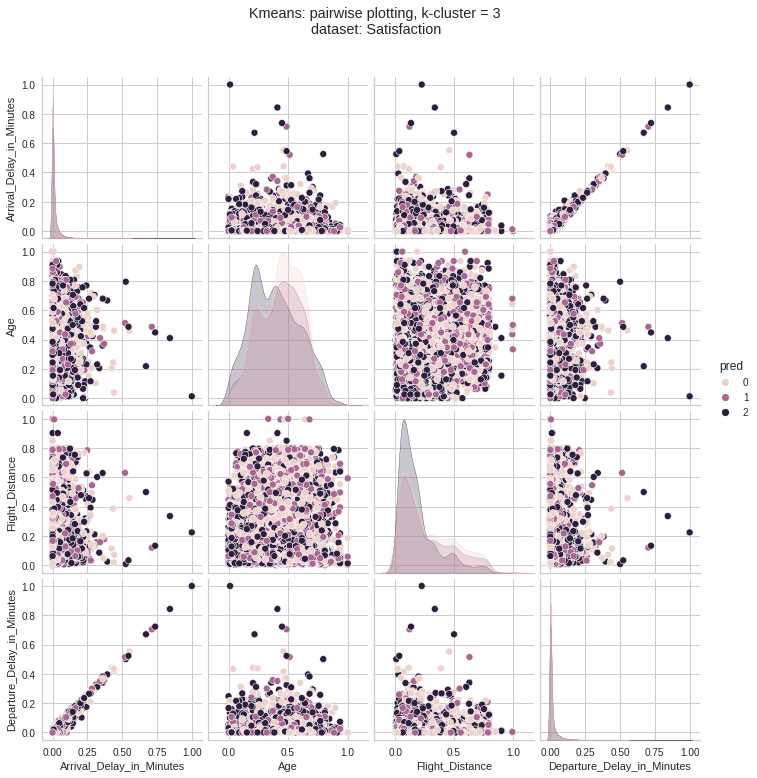

In [ ]:
#Kmeans Pairwise
pair_df = pd.DataFrame(X_train, columns=LABELS)

km = KMeans(n_clusters=3,random_state=7, max_iter=10000)
km.fit(X_train)
labels = km.labels_
pred_clusters = km.predict(X_train)
pred_clusters.shape

filtred_df = pair_df.filter(['Arrival_Delay_in_Minutes',
        'Age','Flight_Distance', 'Departure_Delay_in_Minutes'], axis=1)

filtred_df['pred'] = labels #pred_mal_clusters
ax = sns.pairplot(filtred_df, hue="pred")
ax.fig.suptitle("Kmeans: pairwise plotting, k-cluster = 3\n dataset: Satisfaction", y=1.08)


Text(0.5, 1.08, 'Kmeans: pairwise plotting, k-cluster = 2\n dataset: Satisfaction')

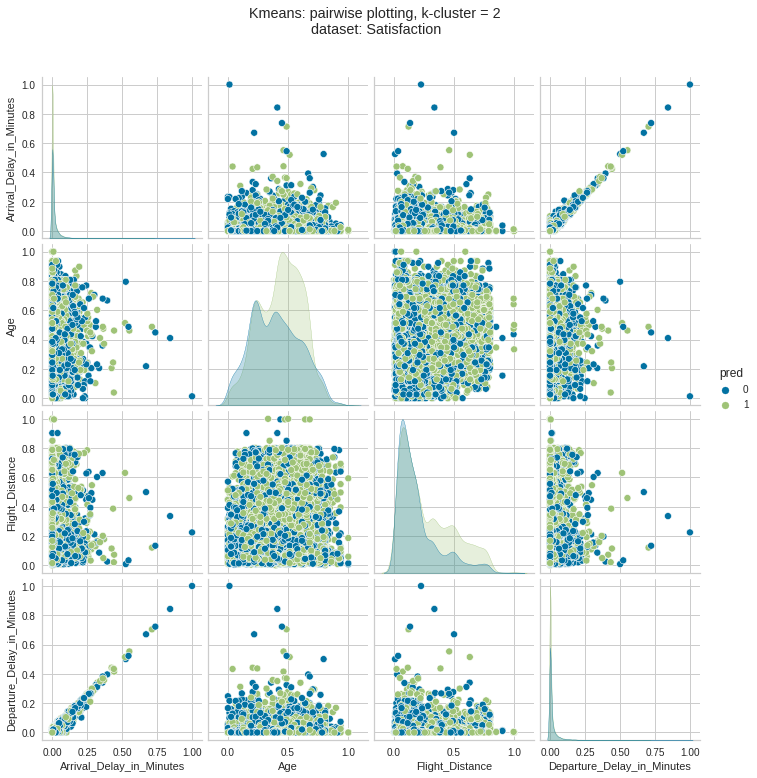

In [ ]:
pair_df = pd.DataFrame(X_train, columns=LABELS)

km = KMeans(n_clusters=2,random_state=7, max_iter=10000)
km.fit(X_train)
labels = km.labels_
pred_clusters = km.predict(X_train)
pred_clusters.shape

filtred_df = pair_df.filter(['Arrival_Delay_in_Minutes',
        'Age','Flight_Distance', 'Departure_Delay_in_Minutes'], axis=1)

filtred_df['pred'] = labels #pred_mal_clusters
ax = sns.pairplot(filtred_df, hue="pred")
ax.fig.suptitle("Kmeans: pairwise plotting, k-cluster = 2\n dataset: Satisfaction", y=1.08)

Text(0.5, 1.08, 'Ground truth labels: pairwise plotting, k-cluster = 2\n dataset: Satisfaction')

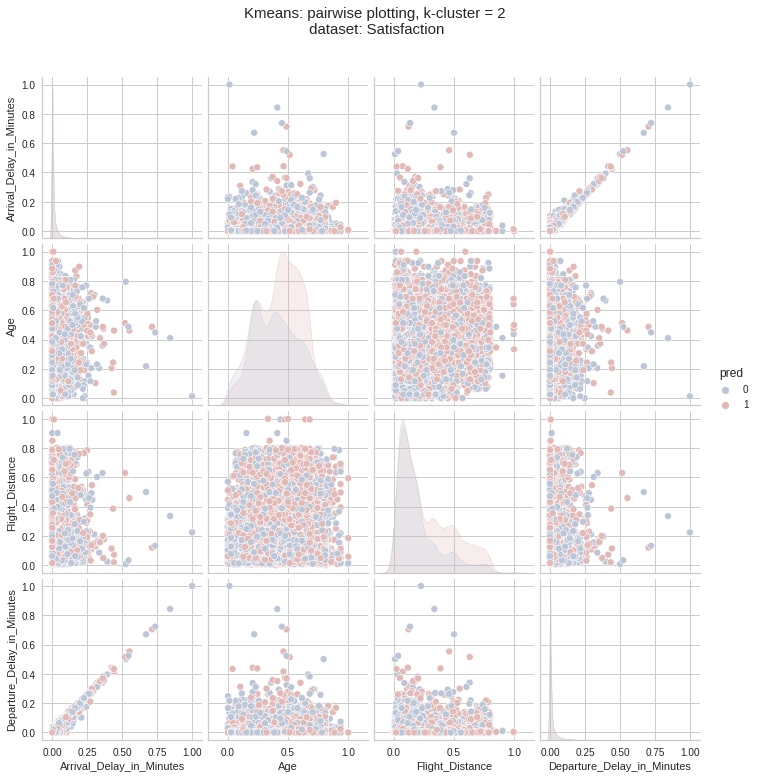

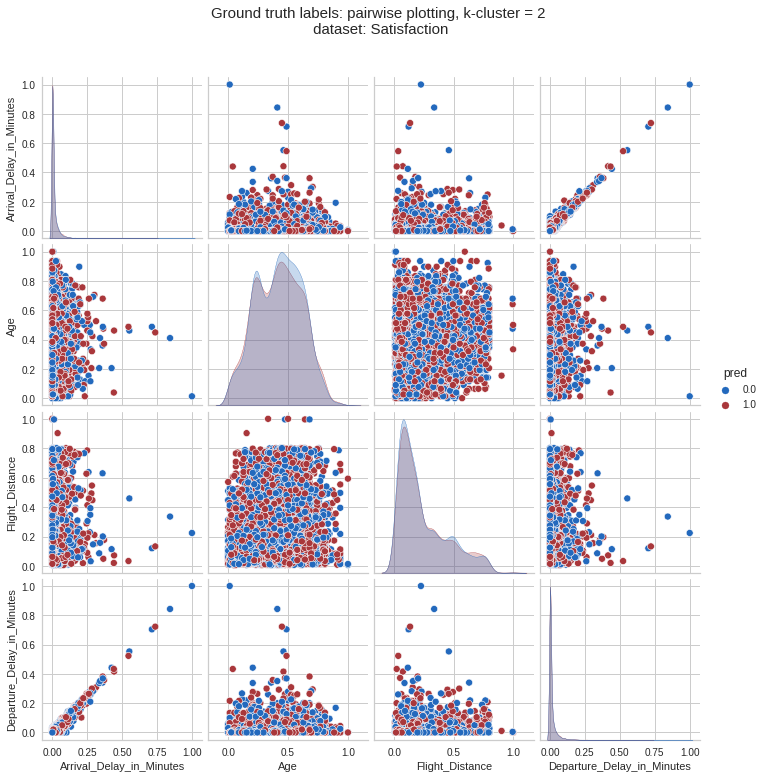

In [ ]:
pair_df = pd.DataFrame(X_train, columns=LABELS)
#Kmeans Pairwise
km = KMeans(n_clusters=2,random_state=7, max_iter=10000 )
km.fit(X_train)
labels = km.labels_
pred_clusters = km.predict(X_train)
pred_clusters.shape

filtred_df = pair_df.filter(['Arrival_Delay_in_Minutes',
        'Age','Flight_Distance', 'Departure_Delay_in_Minutes'], axis=1)


'''
Comparing if the k-means clustering is natually lining up or not with the actual ground truth, just use K=2 
and do pairwise with a few important columns
'''

#USE K=2 k-mean prediction
filtred_df['pred'] = pred_clusters
ax = sns.pairplot(filtred_df, hue="pred", palette = 'vlag' )
ax.fig.suptitle("Kmeans: pairwise plotting, k-cluster = 2\n dataset: Satisfaction", y=1.08, fontsize=15)

#USING ground truth y-values
filtred_df['pred'] = y_train 
ax = sns.pairplot(filtred_df, hue="pred", palette = 'vlag' )
ax.fig.suptitle("Ground truth labels: pairwise plotting, k-cluster = 2\n dataset: Satisfaction", y=1.08, fontsize=15)


# EM

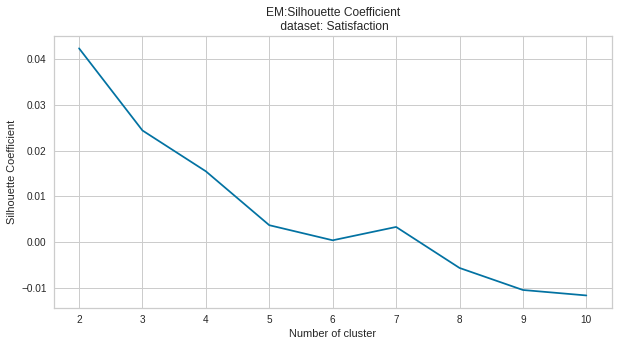

In [ ]:
# Churn dataset on EM
silh_em = {}
homog_em = {}
ll_em = {}
for cluster in range(2,11):
    gmm = GaussianMixture(n_components=cluster, max_iter=10000, random_state=7, 
                          n_init=5).fit(X_train)
    label = gmm.predict(X_train)
    sil_coeff = silhouette_score(X_train, label, metric='euclidean')
    homog_score = homogeneity_score(y_train, label)
    silh_em[cluster] = sil_coeff
    homog_em[cluster] = homog_score
    ll_em[cluster] = gmm.score(X_test)
plt.figure()
plt.plot(list(silh_em.keys()), list(silh_em.values()))
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Coefficient")
plt.title("EM:Silhouette Coefficient\n dataset: Satisfaction")
plt.show()

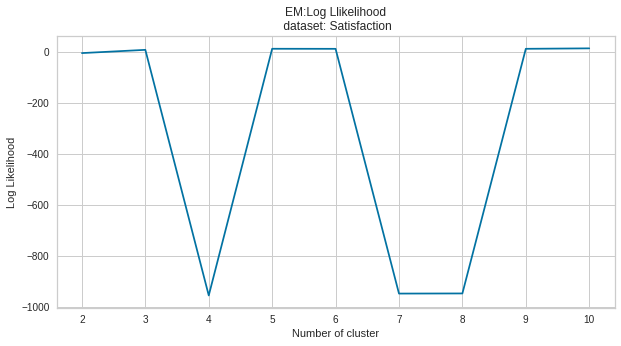

In [ ]:
plt.figure()
plt.plot(list(ll_em.keys()), list(ll_em.values()))
plt.xlabel("Number of cluster")
plt.ylabel("Log Likelihood")
plt.title("EM:Log Llikelihood\n dataset: Satisfaction")
plt.show()

In [ ]:
def get_em_results_names():
    cv_types = ["spherical", "tied", "diag", "full"]
    score_types = ["sil","bic","hom", "fowm", "ami"]
    names = [f"{sc}_{cv}" for sc in score_types for cv in cv_types] 
    return names



def get_em_scores(X, y, N):


    def get_em(n, cv_t):
        gmm = GMM(n_components=n, covariance_type=cv_t, warm_start=True, random_state=7)
        gmm.fit(X)
        gmm_labels = gmm.predict(X)

        ss = silhouette_score(X, gmm_labels, metric='euclidean')
        bic = gmm.bic(X)
        hom = homogeneity_score(y, gmm_labels)
        fowm = fowlkes_mallows_score(y, gmm_labels)
        ami = adjusted_mutual_info_score(y,gmm_labels)
        return ss, bic, hom, fowm, ami
    
    cv_types = ["spherical", "tied", "diag", "full"]
        
    
    n_rng = np.arange(2,N+1)
    
    names =['n'] + get_em_results_names()

    scores_df = pd.DataFrame(columns=names)

    for n in n_rng:
        results = {'n':n}
        for cv_t in cv_types:
            ss_em, bic, hom, fowm, ami = get_em(n,cv_t)            
            results[ f"sil_{cv_t}"] =  ss_em; results[f"bic_{cv_t}"] = bic ; results[f"hom_{cv_t}"] = hom; results[f"fowm_{cv_t}"] = fowm; results[f"ami_{cv_t}"] = ami
        print(f" done with N: {n}")
        
        scores_df = scores_df.append(results, ignore_index=True)
            

    return scores_df

In [ ]:
def plot_elbow_em(k_metric_df, name='dsname', face_color=None):
    
    figsave=False
    
    
    fig = plt.figure(figsize=[20,5])
    ax1 = fig.add_subplot(151)
    ax2 = fig.add_subplot(152)
    ax3 = fig.add_subplot(153)
    ax4 = fig.add_subplot(154)
    ax5 = fig.add_subplot(155)
    allAxs = [ax1, ax2, ax3, ax4, ax5] 

    
    x_vals = k_metric_df['n'].values
    x_vals = x_vals.astype('int32')

    for cv_t in ["spherical", "tied", "diag", "full"]:
        
        ax1.plot(x_vals, k_metric_df['sil_'+cv_t], label=f"{cv_t}")
        ax2.plot(x_vals, k_metric_df['bic_'+cv_t], label=f"{cv_t}")
        ax3.plot(x_vals, k_metric_df['hom_'+cv_t], label=f"{cv_t}")
        ax4.plot(x_vals, k_metric_df['fowm_'+cv_t], label=f"{cv_t}")
        ax5.plot(x_vals, k_metric_df['ami_'+cv_t], label=f"{cv_t}")
   
    ax1.set_xticks(x_vals); ax2.set_xticks(x_vals); ax3.set_xticks(x_vals); ax4.set_xticks(x_vals);ax5.set_xticks(x_vals)
    
    if face_color != None:
        for ax in allAxs:
            ax.set_facecolor(face_color)

    ax1.legend(); ax1.set_ylabel("Silhouette Score"); ax1.set_xlabel("Number of cluster");ax1.grid(True)
    ax2.legend(); ax2.set_ylabel("Bic Score"); ax2.set_xlabel("Number of cluster");ax2.grid(True)
    ax3.legend(); ax3.set_ylabel("Homogeneity Score"); ax3.set_xlabel("Number of cluster"); ax3.grid(True)
    ax4.legend(); ax4.set_ylabel("Fowlkes-Mallows Score"); ax4.set_xlabel("Number of cluster"); ax4.grid(True)
    ax5.legend(); ax5.set_ylabel("AMI Score"); ax5.set_xlabel("Number of cluster"); ax5.grid(True)

    ax1.set_title('EM: Elbow silhouette score\n  dataset: %s '%name)
    ax2.set_title('EM: BIC score\n  dataset: %s '%name)
    ax3.set_title('EM: Homogeneity score\n  dataset: %s '%name)
    ax4.set_title('EM: Fowlkes-Mallows score\n  dataset: %s '%name)
    ax5.set_title('EM: Ajusted Mutual Information score\n  dataset: %s '%name)



    fig.tight_layout()
    plt.show()

    #if figsave:
    #    fig.savefig('plots/em_cov_%s_results.png'%short_name, bbox_inches='tight')
    #    plt.close(fig=fig)
    #else:
    #    plt.show()

In [ ]:
scores_x = get_em_scores(X_train, y_train, 10)

 done with N: 2


KeyboardInterrupt: ignored

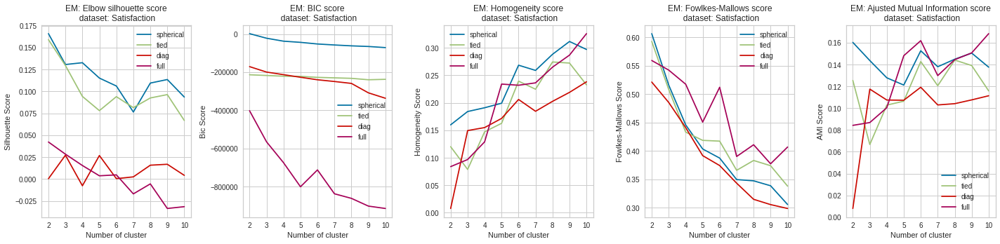

In [ ]:
plot_elbow_em(scores_x, 'Satisfaction')

Text(0.5, 1.08, 'EM: pairwise plotting, k-cluster = 3\n dataset: Satisfaction')

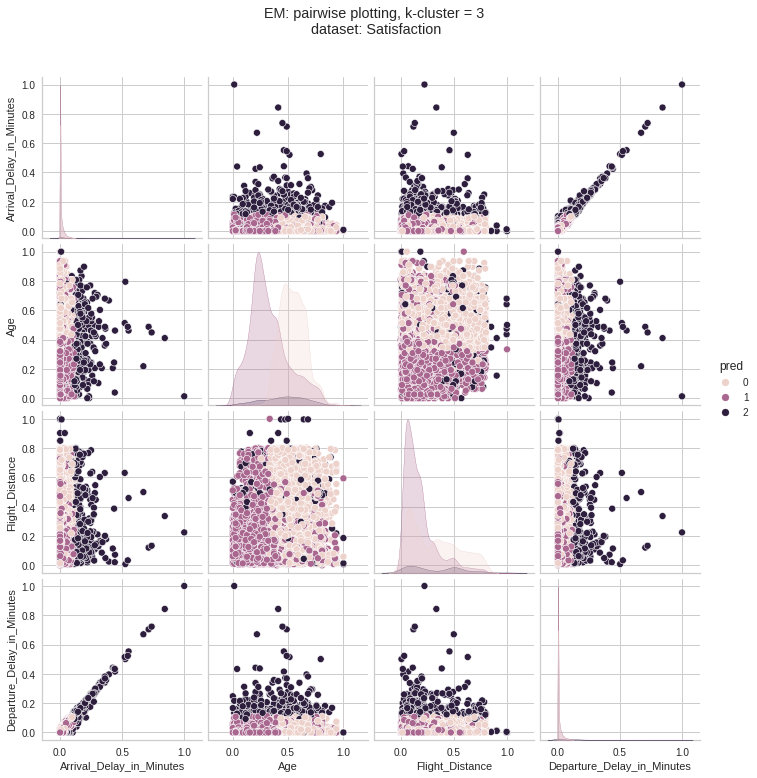

In [ ]:
#em Pairwise
#pair_df = pd.DataFrame(X_train, columns=['Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
#       'Flight_Distance', 'Inflight_wifi_service',
#       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
#       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
#       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
#       'Baggage_handling', 'Checkin_service', 'Inflight_service',
#       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',])

gmm = GMM(n_components=3, covariance_type='full', random_state=7)
gmm.fit(X_train)
#labels2 = gmm.labels_

pred_clusters = gmm.predict(X_train)


filtred_df2 = pair_df.filter(['Arrival_Delay_in_Minutes',
        'Age','Flight_Distance', 'Departure_Delay_in_Minutes'], axis=1)

filtred_df2['pred'] = pred_clusters #pred_mal_clusters
ax = sns.pairplot(filtred_df2, hue="pred")
ax.fig.suptitle("EM: pairwise plotting, k-cluster = 3\n dataset: Satisfaction", y=1.08)


Text(0.5, 1.08, 'EM: pairwise plotting, k-cluster = 5\n dataset: Satisfaction')

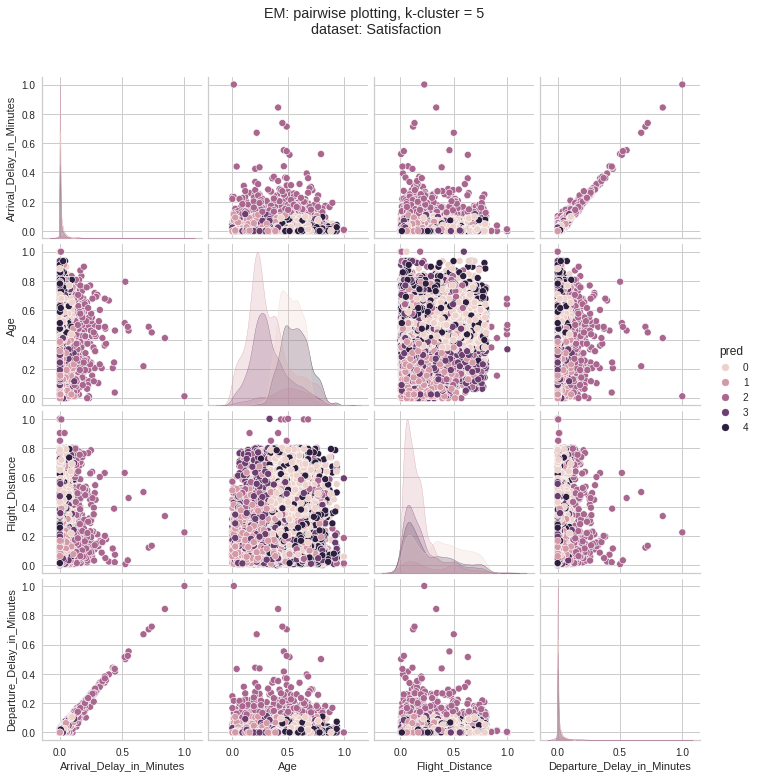

In [ ]:
#em Pairwise
#pair_df = pd.DataFrame(X_train, columns=['Gender', 'Customer_Type', 'Age', 'Type_of_Travel', 'Class',
#       'Flight_Distance', 'Inflight_wifi_service',
#       'Departure_Arrival_time_convenient', 'Ease_of_Online_booking',
#       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
#       'Inflight_entertainment', 'On_board_service', 'Leg_room_service',
#       'Baggage_handling', 'Checkin_service', 'Inflight_service',
#       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',])
pair_df = pd.DataFrame(X_train, columns=LABELS)
gmm = GMM(n_components=5, covariance_type='full', random_state=7)
gmm.fit(X_train)
#labels2 = gmm.labels_

pred_clusters = gmm.predict(X_train)


filtred_df2 = pair_df.filter(['Arrival_Delay_in_Minutes',
        'Age','Flight_Distance', 'Departure_Delay_in_Minutes'], axis=1)

filtred_df2['pred'] = pred_clusters #pred_mal_clusters
ax = sns.pairplot(filtred_df2, hue="pred")
ax.fig.suptitle("EM: pairwise plotting, k-cluster = 5\n dataset: Satisfaction", y=1.08)


Text(0.5, 1.08, 'EM: pairwise plotting, k-cluster = 2\n dataset: Satisfaction')

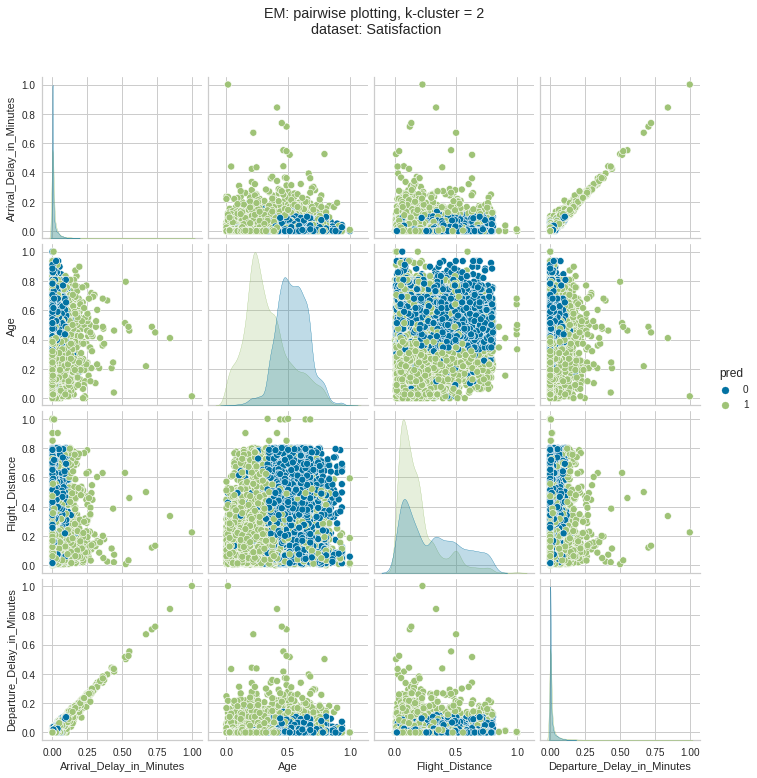

In [ ]:
gmm = GMM(n_components=2, covariance_type='full', random_state=7)
gmm.fit(X_train)
#labels2 = gmm.labels_

pred_clusters = gmm.predict(X_train)


filtred_df2 = pair_df.filter(['Arrival_Delay_in_Minutes',
        'Age','Flight_Distance', 'Departure_Delay_in_Minutes'], axis=1)

filtred_df2['pred'] = pred_clusters #pred_mal_clusters
ax = sns.pairplot(filtred_df2, hue="pred")
ax.fig.suptitle("EM: pairwise plotting, k-cluster = 2\n dataset: Satisfaction", y=1.08)

Text(0.5, 1.08, 'Ground truth labels: pairwise plotting, k-cluster = 2\n dataset: Satisfaction')

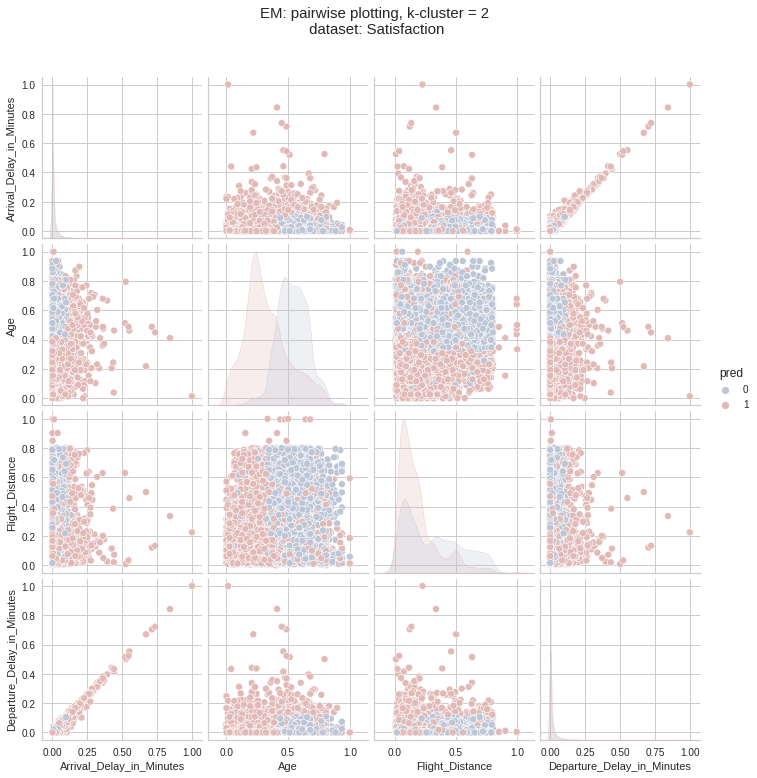

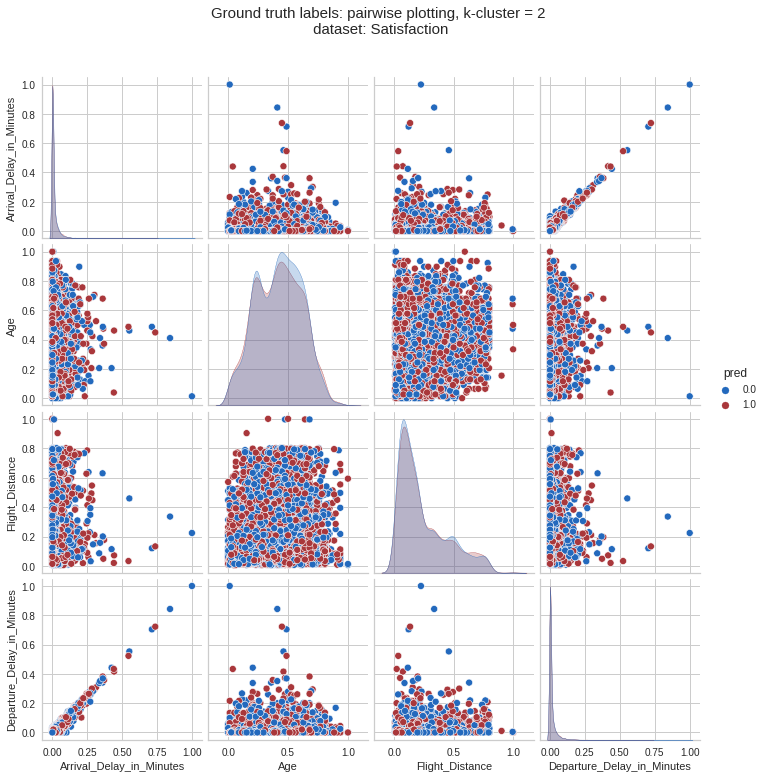

In [ ]:
pair_df = pd.DataFrame(X_train, columns=LABELS)
#EM Pairwise
gmm = GMM(n_components=2, covariance_type='full', random_state=7)
gmm.fit(X_train)
pred_clusters = gmm.predict(X_train)

filtred_df = pair_df.filter(['Arrival_Delay_in_Minutes',
        'Age','Flight_Distance', 'Departure_Delay_in_Minutes'], axis=1)


'''
Comparing if the em clustering is natually lining up or not with the actual ground truth, just use K=2 
and do pairwise with a few important columns
'''

#USE K=2 em prediction
filtred_df['pred'] = pred_clusters
ax = sns.pairplot(filtred_df, hue="pred", palette = 'vlag' )
ax.fig.suptitle("EM: pairwise plotting, k-cluster = 2\n dataset: Satisfaction", y=1.08, fontsize=15)

#USING ground truth y-values
filtred_df['pred'] = y_train 
ax = sns.pairplot(filtred_df, hue="pred", palette = 'vlag' )
ax.fig.suptitle("Ground truth labels: pairwise plotting, k-cluster = 2\n dataset: Satisfaction", y=1.08, fontsize=15)

# Feature Reduction

## PCA

In [ ]:
pca = PCA(random_state=7)
pca.fit(X_train)
pca_ind = pca.explained_variance_ratio_
print(pca_ind)

pca_cumsum = pca.explained_variance_ratio_.cumsum()
print(pca_cumsum)

[2.45390087e-01 1.76658194e-01 1.35341298e-01 7.74994290e-02
 7.04518526e-02 4.42720758e-02 4.17008762e-02 3.75786774e-02
 3.02144485e-02 2.84683333e-02 2.48841740e-02 2.04243391e-02
 1.94960838e-02 1.84949685e-02 1.64158426e-02 1.06938194e-02
 1.98421797e-03 3.12832897e-05]
[0.24539009 0.42204828 0.55738958 0.63488901 0.70534086 0.74961294
 0.79131381 0.82889249 0.85910694 0.88757527 0.91245945 0.93288378
 0.95237987 0.97087484 0.98729068 0.9979845  0.99996872 1.        ]


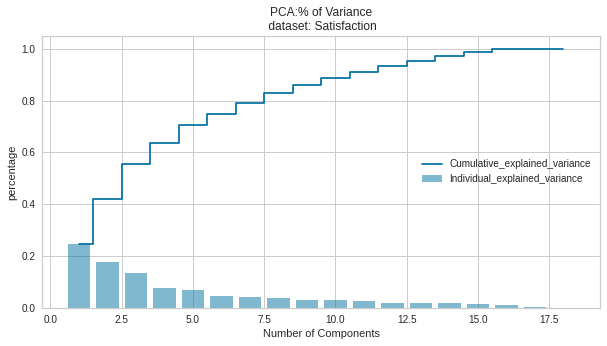

In [ ]:
plt.bar(range(1, 19), pca_ind, alpha=0.5, align='center', label='Individual_explained_variance')  
plt.step(range(1, 19), pca_cumsum, where='mid', label='Cumulative_explained_variance') 
plt.ylabel("percentage")
plt.xlabel("Number of Components")
plt.title("PCA:% of Variance\n dataset: Satisfaction")
plt.legend(loc='right')
plt.show()

In [ ]:
pca.explained_variance_ratio_[:11
                             ].sum()

0.9124594453739173

In [ ]:
pca1 = PCA(n_components=11,random_state=7)
pca1.fit(X_train)
pca_X =pca1.transform(X_train)

In [ ]:
import seaborn as sns

def plot_pca(vector_num,top_comp):
    v_1 = pca1.components_[vector_num]
    comps = pd.DataFrame(list(zip(v_1, X.columns.values)), 
                             columns=['weights', 'features'])
    comps['abs_weights']=comps['weights'].apply(lambda x: np.abs(x))
    sorted_weight_data = comps.sort_values('abs_weights', ascending=False).head(top_comp)
    ax=plt.subplots(figsize=(10,6))
    ax=sns.barplot(data=sorted_weight_data, 
                   x="weights", 
                   y="features",
                   color = "C0"
                   #palette="pastel"
                  )
    ax.set_title("PCA:Component Analyzation,Component #" + str(vector_num) + "\n dataset: Satisfaction")
    plt.show()

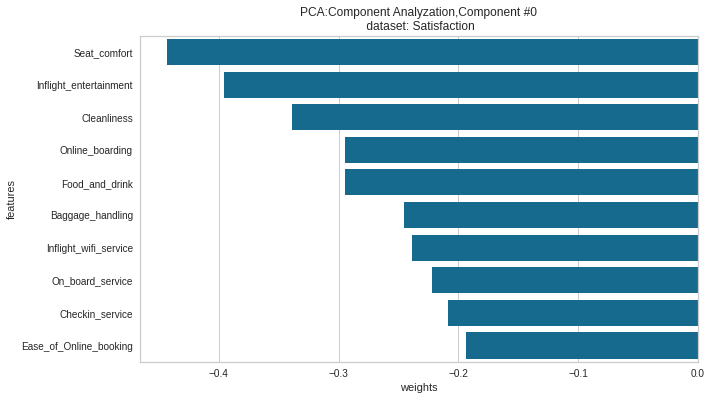

In [ ]:
plot_pca(0,10)

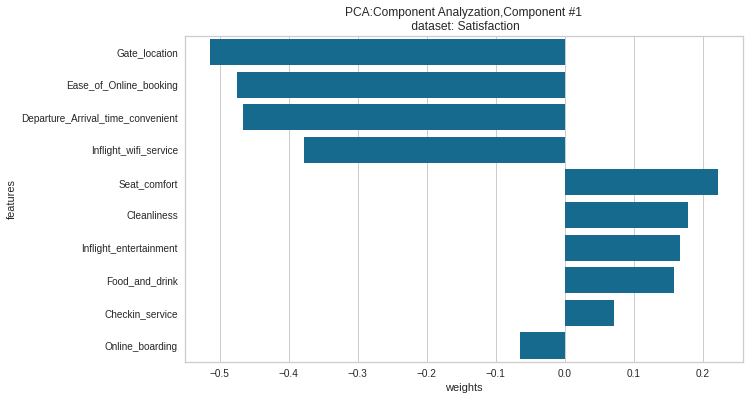

In [ ]:
plot_pca(1,10)

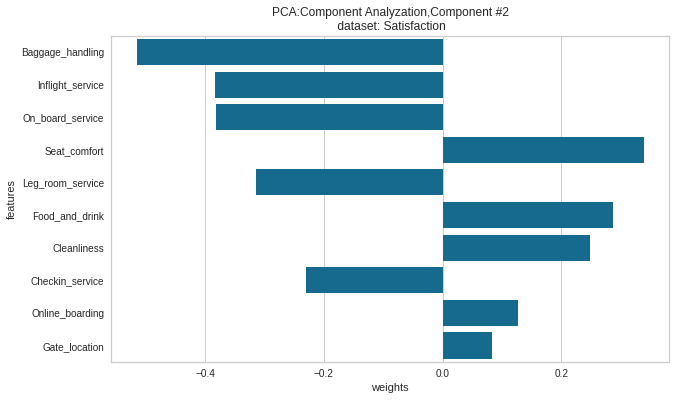

In [ ]:
plot_pca(2,10)

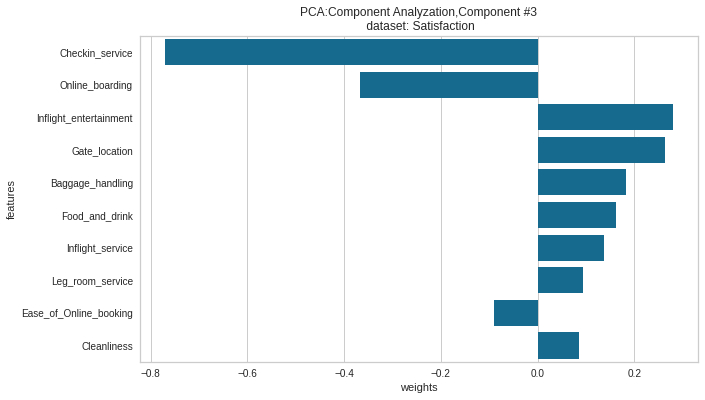

In [ ]:
plot_pca(3,10)

In [ ]:
def pca(X, cutoff_per, var_threashold):
    pca = PCA(cutoff_per, random_state=7)
    pca.fit(X)
    pca.explained_variance_

    row_index = range(1, pca.explained_variance_.shape[0] + 1)
    ev = pd.Series(data=pca.explained_variance_, index=row_index)
    evr = pd.Series(data=pca.explained_variance_ratio_, index=row_index)
    eigen = pd.Series(data=pca.singular_values_, index=row_index)  
    
    pca_stats_df = pd.DataFrame()
    pca_stats_df['pca_stats_df'] = ev
    pca_stats_df['e-variance-ratio'] = evr
    pca_stats_df['eigen'] = eigen

    var_above = pca_stats_df[pca_stats_df['pca_stats_df'] >= var_threashold]
    #print(pca_stats_df)
    print("Original PCA components")
    print(pca_stats_df)
    print(f"Threshold PCA components variance >= [{var_threashold:.2f}%]")
    print(var_above)
  
    constrained_cols = var_above.index-1
    X_pca_projected = pca.transform(X)

    return pd.DataFrame(X_pca_projected).filter(constrained_cols, axis=1)

In [ ]:
print(f"\n---- RUNNING PCA -------")
X_pca_proj_test = pca(X_train, 0.9, 0.1)


---- RUNNING PCA -------
Original PCA components
    pca_stats_df  e-variance-ratio      eigen
1       0.295041          0.245390  68.513502
2       0.212402          0.176658  58.131905
3       0.162725          0.135341  50.881842
4       0.093180          0.077499  38.503208
5       0.084707          0.070452  36.710802
6       0.053230          0.044272  29.101314
7       0.050138          0.041701  28.243613
8       0.045182          0.037579  26.811333
9       0.036328          0.030214  24.041137
10      0.034228          0.028468  23.336122
11      0.029919          0.024884  21.817716
Threshold PCA components variance >= [0.10%]
   pca_stats_df  e-variance-ratio      eigen
1      0.295041          0.245390  68.513502
2      0.212402          0.176658  58.131905
3      0.162725          0.135341  50.881842


##ICA

In [ ]:
ks = [1,2,3,4,5,6,7,8,9,10,11,12]
def find_ica(ks,X):
    results = []
    for k in ks:
        transformerlarge = FastICA(n_components=k,
                random_state=0)
        X_transformed_large = transformerlarge.fit_transform(X)
        results.append(kurtosis(X_transformed_large))#.mean()
    return results

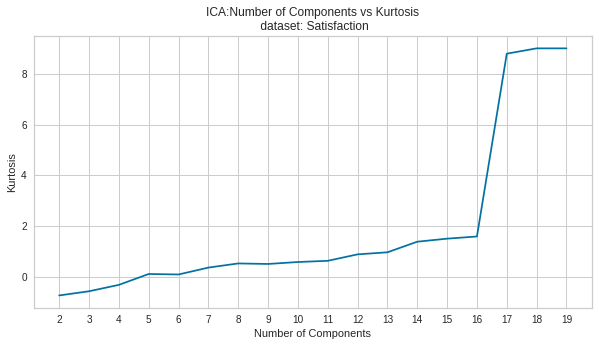

In [ ]:
ks = range(2,20)
results = find_ica(ks,X_train)
rs = []
for r in results:
    rs.append(r.mean())
plt.title('ICA:Number of Components vs Kurtosis\n dataset: Satisfaction')
plt.xlabel('Number of Components')
plt.ylabel('Kurtosis')
plt.xticks(range(18),ks)
plt.plot(rs)

In [ ]:
def max_kurtosis_indexes(X_projected, cutoff):
    tmp = pd.DataFrame(X_projected)
    tmp = tmp.kurt(axis=0)
    kurt = tmp.sort_values(ascending=False)
        
    max_k = kurt[0:cutoff]
    print(f"Top-{cutoff} Max Kurtosis -- ")
    print(max_k)
    print(max_k.index)
    return max_k.index

In [ ]:
def ica_max_kurtosis(X, cutoff, dim=0):

    if dim == 0:
        dim = X.shape[1]-1
    elif dim < cutoff:
        dim = cutoff

    ica = FastICA(random_state=7)
    ica.set_params(n_components=dim)
    X_projected = ica.fit_transform(X)

    max_k_idexes = max_kurtosis_indexes(X_projected,cutoff)
    
    X_proj_df = pd.DataFrame(X_projected)
    X_proj_df  = X_proj_df.filter( max_k_idexes, axis=1 )
        
    return X_proj_df

In [ ]:
def ica_research(X, dim, cutoff):
    should_whiten = True
    ica = FastICA(dim, random_state=7, whiten=should_whiten, max_iter=10000)
    S_ = ica.fit_transform(X)
    A_ = ica.mixing_
    C_ = ica.components_
    
    max_k_idexes = max_kurtosis_indexes(S_,cutoff)
    
    mean_ = ica.mean_ if should_whiten else 0
    print(f"X.shape = {X.shape}")
    C_filtered = pd.DataFrame(C_).filter( max_k_idexes, axis=0)
    return A_, C_, C_filtered, mean_

In [ ]:
A_ , C_, C_filtered, mean_ = ica_research(X_train, 17, 10)

Top-10 Max Kurtosis -- 
10    124.495214
5       5.177310
11      4.233901
12      3.936066
2       3.689668
3       2.778807
6       2.324534
15      2.302554
1       2.279585
14      1.468512
dtype: float64
Int64Index([10, 5, 11, 12, 2, 3, 6, 15, 1, 14], dtype='int64')
X.shape = (15911, 18)


Top-5 Max Kurtosis -- 
10    124.495214
5       5.177310
11      4.233901
12      3.936066
2       3.689668
dtype: float64
Int64Index([10, 5, 11, 12, 2], dtype='int64')
X.shape = (15911, 18)


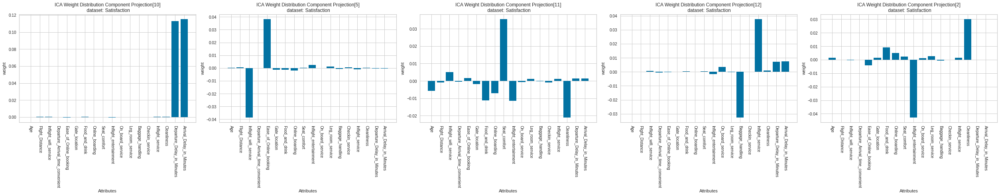

In [ ]:
A_ , C_, C_filtered, mean_ = ica_research(X_train, 17, 5)
pd.DataFrame(C_filtered)
def plot_ica_dists(C_df,labels_list):
#     C_df.plot.bar()
   
    r,c = C_df.shape;
    #print (r)
    #print (c)
    #fig, ax_val = plt.subplots(2, r//2, figsize=(3*7,7))
    fig, ax_val = plt.subplots(1, r, figsize=(r*7,7))
    ax = ax_val if type(ax_val) == np.ndarray else [ax_val]
    for i in range(r):
        ax[i].bar( C_df.columns, C_df.iloc[i,:].values)
        ax[i].set_xlabel('Attributes')
        ax[i].set_xticks(C_df.columns)
        ax[i].set_xticklabels(labels_list)
        ax[i].tick_params(axis='x', labelrotation = -90)
        ax[i].set_ylabel('weight')
        ax[i].set_title(f"ICA Weight Distribution Component Projection[{C_df.index[i]}]\n dataset: Satisfaction")
    fig.tight_layout()
    plt.show()

plot_ica_dists(C_filtered, LABELS)


## Randomized Projections

In [ ]:
rs = [0, 77, 888, 5678, 98765, 543216, 123456789]
ks = [5,8,10,12,15,18,20]
ks = range(2,21)
def find_rand_proj(ks=ks,X=X):
    results = []
    for k in ks:
        error = 0
        for i in rs:
            gauRP = GaussianRandomProjection(random_state=i,n_components=k)

            gau = gauRP.fit_transform(X)
            
            X_transformed_large = gauRP.fit_transform(X)
            error += mean_squared_error(np.dot(gau,gauRP.components_), X)
        results.append(error/k)
    return results

In [ ]:
randp_result = find_rand_proj()

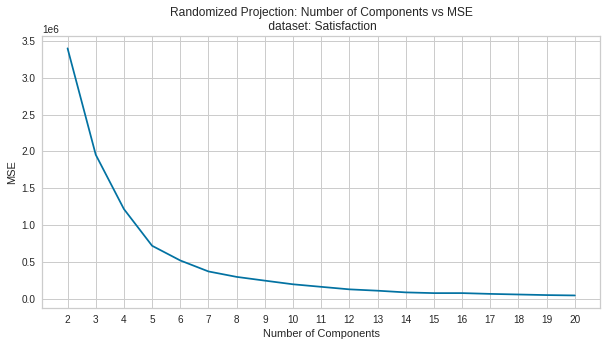

In [ ]:
plt.title('Randomized Projection: Number of Components vs MSE\n dataset: Satisfaction')
plt.xlabel('Number of Components')
plt.ylabel('MSE')
plt.xticks(range(len(ks)),ks)
plt.plot(randp_result)

In [ ]:
def pairwiseDistCorr(X1,X2):
    assert X1.shape[0] == X2.shape[0]
    
    d1 = pairwise_distances(X1)
    d2 = pairwise_distances(X2)
    return np.corrcoef(d1.ravel(),d2.ravel())[0,1]

def reconstruction_error(projections, x):
    w = projections.components_
    if sps.issparse(w):
        w = w.todense()
    p = pinv(w)
    reconstructed = ((p@w)@(x.T)).T  # Unproject projected data
    
    errors = mean_squared_error(x,reconstructed)

    return np.nanmean(errors)

def rca_research(X, title):
    dims = range(2, X.shape[1] + 1)
    recon_dict = defaultdict(dict)

    #r_states = [89143, 92, 1081244453, 8772, 212]
    #r_states = [0, 77, 888, 5678, 98765, 543216, 123456789]
    #r_states = [888, 5678, 98765, 543216, 123456789]
    r_states = [0, 77, 888, 5678, 98765, 543216, 6789432, 98273615, 123456789, 7]
    i = 0
    for r,dim in product(r_states,dims):
        rp = RCA(random_state=r, n_components=dim)
        rp.fit(X)
        recon_dict[dim][i%len(r_states)] = reconstruction_error(rp, X)
        i += 1
        
    tmp = pd.DataFrame(recon_dict).T
    print(tmp)
    mean_recon_df = tmp.mean(axis=1)
    mean_recon = mean_recon_df.tolist()
    std_recon = tmp.std(axis=1).tolist()
    
    print("*** reconstruction MSE***")
    print(mean_recon_df)
    


    fig, ax1 = plt.subplots()
    ax1.plot(dims,mean_recon, 'C0-')
    ax1.set_xlabel('Number of Components')
    # Make the y-axis label, ticks and tick labels match the line color.
    ax1.set_ylabel('Mean Reconstruction Error', color='C0')
    ax1.tick_params('y', colors='C0')
    plt.grid(False)

    ax2 = ax1.twinx()
    ax2.plot(dims,std_recon, linestyle='--', color='darkorange', linewidth=0.75)
    ax2.set_ylabel('STD Reconstruction Error', color='darkorange' )
    ax2.tick_params('y', colors='darkorange')
    plt.grid(False)

    plt.title("Random Components: 10 Restarts \n"+ title)
    fig.tight_layout()
    plt.show()

In [ ]:
def rp(X, dim, r_state=7):
    rp = RCA(random_state=r_state, n_components=dim)
    fitted = rp.fit(X)
    X_rca_projected = rp.transform(X)
    return pd.DataFrame(X_rca_projected)

               0             7             4             1         8  \
2   3.852812e-01  3.278414e-01  3.444169e-01  3.457822e-01  0.361898   
3   2.901715e-01  3.636634e-01  3.625144e-01  2.896820e-01  0.368453   
4   3.717573e-01  3.430216e-01  3.170710e-01  2.694449e-01  0.326440   
5   2.442598e-01  2.864306e-01  3.732007e-01  2.983292e-01  0.268762   
6   3.294863e-01  2.783625e-01  2.787370e-01  3.041893e-01  0.316300   
7   2.810845e-01  3.179359e-01  2.182812e-01  3.544832e-01  0.280490   
8   2.533005e-01  2.522013e-01  2.467622e-01  2.328025e-01  0.237560   
9   2.966099e-01  2.265551e-01  1.933427e-01  2.651149e-01  0.179302   
10  1.029183e-01  2.169727e-01  1.465505e-01  2.462087e-01  0.132693   
11  1.008529e-01  1.360184e-01  1.116408e-01  7.803699e-02  0.178195   
12  1.266931e-01  1.125976e-01  2.778018e-01  1.237830e-01  0.167998   
13  1.112307e-01  1.090034e-01  1.748343e-01  4.386747e-02  0.116365   
14  6.341151e-02  1.911398e-01  8.889606e-02  4.731751e-02  0.16

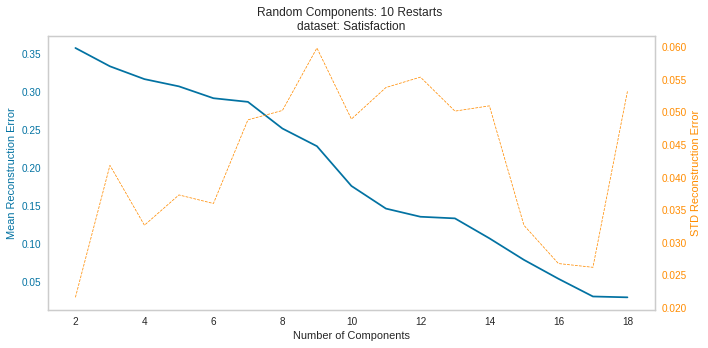

In [ ]:
rca_research(X_train, 'dataset: Satisfaction')

               0             2         4             1             3
2   3.444169e-01  3.457822e-01  0.361898  3.354291e-01  3.804895e-01
3   3.555682e-01  3.774710e-01  0.363663  3.488339e-01  3.134681e-01
4   3.264397e-01  2.721868e-01  0.307564  3.717573e-01  3.430216e-01
5   3.732007e-01  2.983292e-01  0.268762  3.295650e-01  2.864306e-01
6   3.190773e-01  3.294863e-01  0.316300  3.339326e-01  2.450593e-01
7   2.244900e-01  2.444768e-01  0.342022  2.810845e-01  3.544832e-01
8   2.467622e-01  2.328025e-01  0.226012  2.533005e-01  2.522013e-01
9   3.482411e-01  2.651149e-01  0.179302  1.542485e-01  2.245427e-01
10  2.198750e-01  2.023775e-01  0.150465  1.465505e-01  2.079120e-01
11  1.116408e-01  1.809613e-01  0.090424  1.008529e-01  1.360184e-01
12  2.778018e-01  1.237830e-01  0.167998  1.364893e-01  9.500430e-02
13  2.260684e-01  1.810393e-01  0.109003  1.104316e-01  1.227957e-01
14  1.612929e-01  7.745897e-02  0.049015  6.341151e-02  1.911398e-01
15  8.384699e-02  5.937992e-02  0.

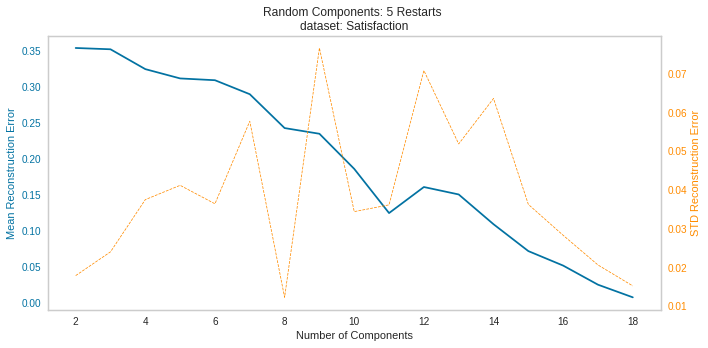

In [ ]:
def rca_research_2(X, title):
    dims = range(2, X.shape[1] + 1)
    recon_dict = defaultdict(dict)

    #r_states = [89143, 92, 1081244453, 8772, 212]
    #r_states = [0, 77, 888, 5678, 98765, 543216, 123456789]
    r_states = [888, 5678, 98765, 543216, 123456789]
    #r_states = [0, 77, 888, 5678, 98765, 543216, 6789432, 98273615, 123456789, 7]
    i = 0
    for r,dim in product(r_states,dims):
        rp = RCA(random_state=r, n_components=dim)
        rp.fit(X)
        recon_dict[dim][i%len(r_states)] = reconstruction_error(rp, X)
        i += 1
        
    tmp = pd.DataFrame(recon_dict).T
    print(tmp)
    mean_recon_df = tmp.mean(axis=1)
    mean_recon = mean_recon_df.tolist()
    std_recon = tmp.std(axis=1).tolist()
    
    print("*** reconstruction MSE***")
    print(mean_recon_df)
    


    fig, ax1 = plt.subplots()
    ax1.plot(dims,mean_recon, 'C0-')
    ax1.set_xlabel('Number of Components')
    # Make the y-axis label, ticks and tick labels match the line color.
    ax1.set_ylabel('Mean Reconstruction Error', color='C0')
    ax1.tick_params('y', colors='C0')
    plt.grid(False)

    ax2 = ax1.twinx()
    ax2.plot(dims,std_recon, linestyle='--', color='darkorange', linewidth=0.75)
    ax2.set_ylabel('STD Reconstruction Error', color='darkorange' )
    ax2.tick_params('y', colors='darkorange')
    plt.grid(False)

    plt.title("Random Components: 5 Restarts \n"+ title)
    fig.tight_layout()
    plt.show()
def rp_2(X, dim, r_state=7):
    rp_2 = RCA(random_state=r_state, n_components=dim)
    fitted = rp.fit(X)
    X_rca_projected = rp.transform(X)
    return pd.DataFrame(X_rca_projected)

rca_research_2(X_train, 'dataset: Satisfaction')


## Random Forest

In [17]:
clf = RandomForestClassifier(n_estimators=100, random_state=7)
clf.fit(X_train, y_train)
tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_importance_sorted_idx
clf.feature_importances_[tree_importance_sorted_idx[-7:]]

array([0.04649369, 0.05398462, 0.05884403, 0.06512623, 0.07857268,
       0.15780667, 0.21845421])

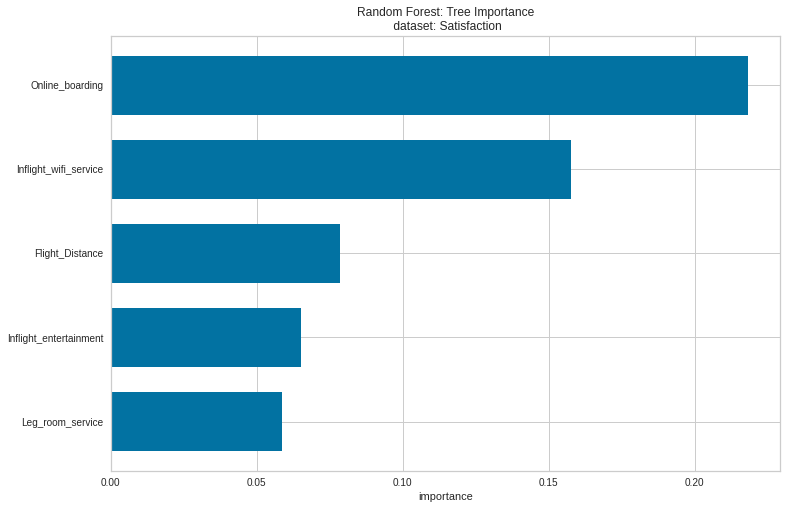

In [18]:
tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_indices = np.arange(0, len(clf.feature_importances_)) + 0.5

fig, ax1 = plt.subplots(1, 1, figsize=(12, 8))

ax1.barh(tree_indices[-5:],
         clf.feature_importances_[tree_importance_sorted_idx[-5:]], height=0.7)
ax1.set_yticklabels(X.columns[tree_importance_sorted_idx][-5:])
ax1.set_yticks(tree_indices[-5:])
ax1.set_xlabel('importance')
plt.title('Random Forest: Tree Importance\n dataset: Satisfaction')
plt.show()

In [ ]:
def rfc_research(X,y):
                 
        rfc = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=7, n_jobs=-1)
        fs = rfc.fit(X,y).feature_importances_
        return fs
        
def rfc(X,y):
                 
        rfc = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=7, n_jobs=-1)
        fs = rfc.fit(X,y).feature_importances_
        indexes_found = np.where(fs >= 0.05)
        #print("index:",indexes_found[0])
        
        X_reduced = pd.DataFrame(X)
        #print("X_reduced",X_reduced)
        filter_columns = [list(X_reduced.columns)[i] for i in indexes_found[0]] 
        #print(filter_columns)
        X_reduced = X_reduced.filter(filter_columns, axis=1)
        #print(X_reduced)
        
        return X_reduced

In [ ]:
#Research for Random Forest
important = rfc_research(X_train, y_train)
important_df = pd.DataFrame(columns=LABELS)
df_length = len(important_df)
important_df.loc[df_length] = important
print("*** importance ***:")
print(pd.Series(important))

print(rfc(X_train, y_train))

*** importance ***:
0     0.054841
1     0.075827
2     0.158530
3     0.043576
4     0.046614
5     0.026508
6     0.020313
7     0.220283
8     0.045466
9     0.068051
10    0.035777
11    0.060088
12    0.025220
13    0.025393
14    0.026602
15    0.029547
16    0.018389
17    0.018976
dtype: float64
             0         1    2    7    9    11
0      0.307692  0.351373  0.6  0.6  0.6  0.8
1      0.551282  0.338853  0.8  0.6  0.8  0.8
2      0.551282  0.404483  0.8  1.0  0.8  0.8
3      0.538462  0.491115  0.4  0.2  1.0  1.0
4      0.320513  0.090872  0.4  0.4  0.4  0.6
...         ...       ...  ...  ...  ...  ...
15906  0.384615  0.063207  0.2  0.2  0.4  1.0
15907  0.512821  0.015347  1.0  1.0  1.0  1.0
15908  0.615385  0.167811  0.6  0.4  0.6  0.6
15909  0.243590  0.195679  0.2  0.2  0.2  0.4
15910  0.320513  0.167811  0.0  0.0  1.0  0.4

[15911 rows x 6 columns]


In [ ]:
print(f"\n---- RUNNING Random Forest RFC -------")
X_rfc_proj = rfc(X_train,y_train)



---- RUNNING Random Forest RFC -------


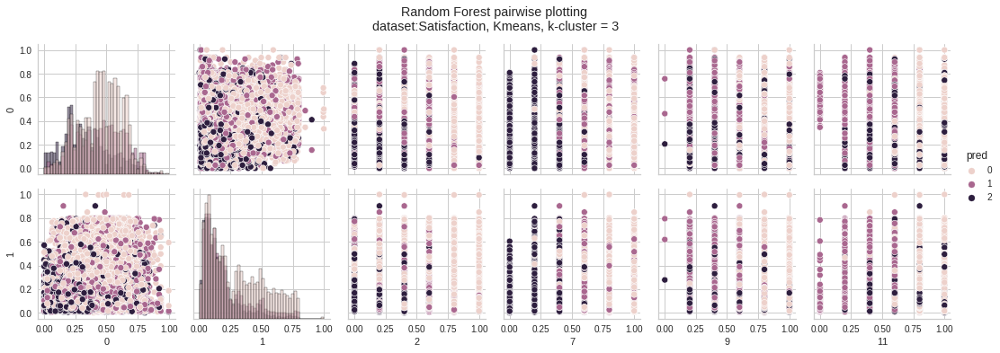

In [ ]:
plot_km_pairwise(X_rfc_proj, 3, 'Random Forest pairwise plotting\n dataset:Satisfaction')

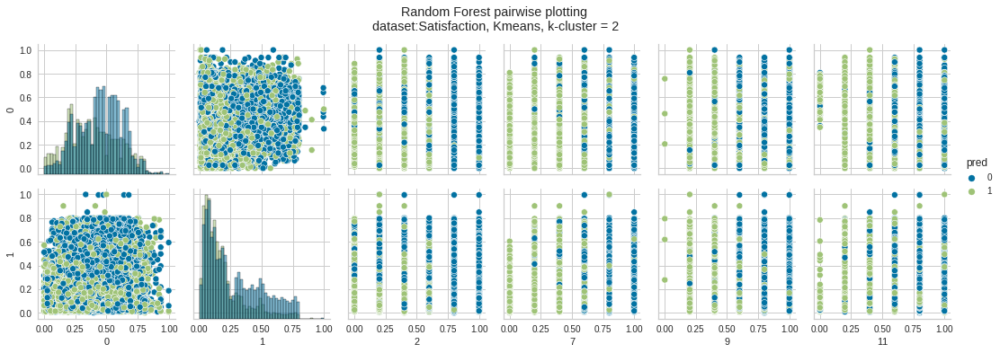

In [ ]:
plot_km_pairwise(X_rfc_proj, 2, 'Random Forest pairwise plotting\n dataset:Satisfaction')

# Projections

In [ ]:
print(f"\n---- RUNNING PCA -------")
X_pca_proj = pca(X_train, 0.9, 0.1)

print(f"---- RUNNING ICA -------")
X_ica_proj = ica_max_kurtosis(X_train ,5, dim=17)

print(f"\n---- RUNNING RP -------")
r_states = [0, 77, 888, 5678, 98765, 543216, 6789432, 98273615, 123456789, 7]
X_rp_proj = []
for r in r_states:
    X_rp = rp(X_train, 13, r)
    X_rp_proj.append(X_rp)

print(f"\n---- RUNNING Random Forest RFC -------")
X_rfc_proj = rfc(X_train,y_train)

print(f"Shapes for rfc: {X_rfc_proj.shape} ")


---- RUNNING PCA -------
Original PCA components
    pca_stats_df  e-variance-ratio      eigen
1       0.295041          0.245390  68.513502
2       0.212402          0.176658  58.131905
3       0.162725          0.135341  50.881842
4       0.093180          0.077499  38.503208
5       0.084707          0.070452  36.710802
6       0.053230          0.044272  29.101314
7       0.050138          0.041701  28.243613
8       0.045182          0.037579  26.811333
9       0.036328          0.030214  24.041137
10      0.034228          0.028468  23.336122
11      0.029919          0.024884  21.817716
Threshold PCA components variance >= [0.10%]
   pca_stats_df  e-variance-ratio      eigen
1      0.295041          0.245390  68.513502
2      0.212402          0.176658  58.131905
3      0.162725          0.135341  50.881842
---- RUNNING ICA -------
Top-5 Max Kurtosis -- 
10    124.370933
5       5.174867
11      4.243810
12      3.918756
2       3.636727
dtype: float64
Int64Index([10, 5, 11, 12

##K-means with projections

In [ ]:
print("Starting PCA scores")
scores_df_pca = get_kmean_scores(X_pca_proj, y_train, 10)

print("Starting ICA score")
scores_df_ica = get_kmean_scores(X_ica_proj, y_train, 10)

scores_df_rp = []
for i in range(len(X_rp_proj)):
    print(f"Starting RP scores [{i}]")
    scores_df_rp.append(get_kmean_scores(X_rp_proj[i], y_train, 10))
    
print("Starting RFC scores")
scores_df_rfc = get_kmean_scores(X_rfc_proj,  y_train, 10)

Starting PCA scores
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting ICA score
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [0]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [1]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [2]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [3]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10

In [ ]:
def merge_scores_df_list(scores_df_list):
    scores_all_df = pd.DataFrame(scores_df_list[0])
    for i in range(1,len(scores_df_list)):
        scores_all_df += scores_df_list[i]
    
    scores_all_df = scores_all_df / len(scores_df_list)
    return scores_all_df

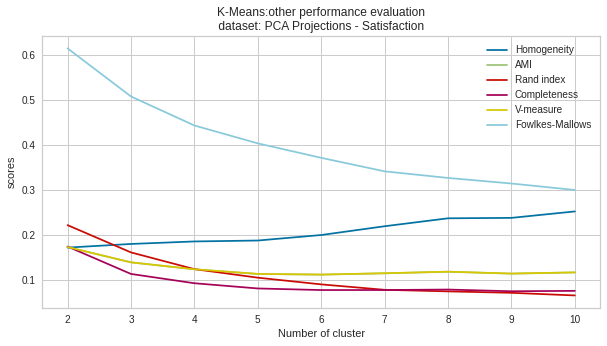

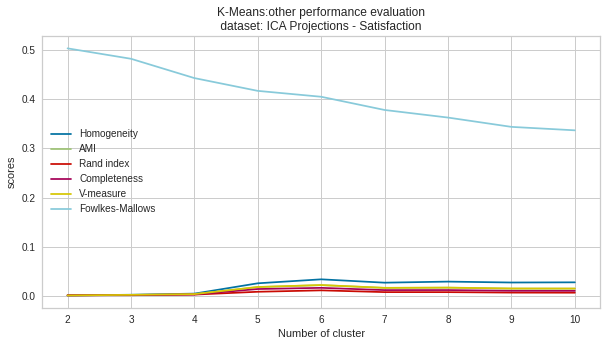

(9, 7), (9, 7)


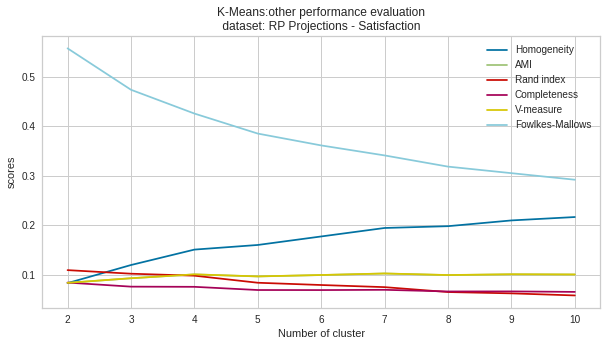

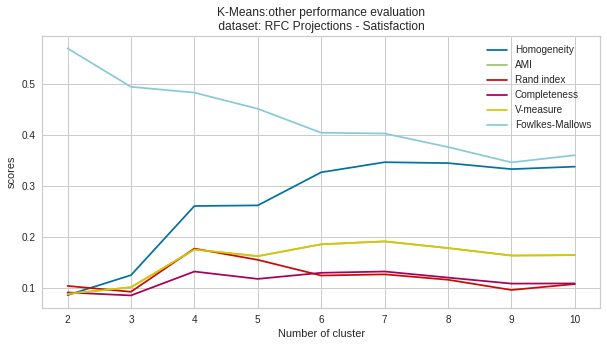

In [ ]:
plot_elbow_kmeans(scores_df_pca, 'PCA Projections - Satisfaction')

plot_elbow_kmeans(scores_df_ica, 'ICA Projections - Satisfaction')

scores_all_df_rp = merge_scores_df_list(scores_df_rp)
print(f"{scores_all_df_rp.shape}, {scores_df_rp[0].shape}")
plot_elbow_kmeans(scores_all_df_rp, 'RP Projections - Satisfaction')

plot_elbow_kmeans(scores_df_rfc, 'RFC Projections - Satisfaction')


In [ ]:
def plot_km_pairwise(X, N, title):
    
    km = KMeans(n_clusters=N,random_state=7, max_iter=10000)
    km.fit(X)
    pred_clusters = km.predict(X)


    filtred_df = X.copy()  
    x_vars = filtred_df.columns     
    filtred_df['pred'] = pred_clusters  
    y_vars = filtred_df.columns[0:2]
    #print("y_vars:",y_vars)
    
    ax = sns.PairGrid(filtred_df, hue="pred", x_vars=x_vars, y_vars=y_vars)
    #label_list = ["SSLfinal_State", "Request_URL", "Domain_registeration_length", "web_traffic", "age_of_domain", "URL_of_Anchor"]
    #ax.set_xticklabels(label_list)
    ax.map_diag(sns.histplot)
    ax.map_offdiag(sns.scatterplot)
    ax.add_legend()
    ax.fig.suptitle("%s, Kmeans, k-cluster = %d"%(title,N), y=1.08)

### PCA

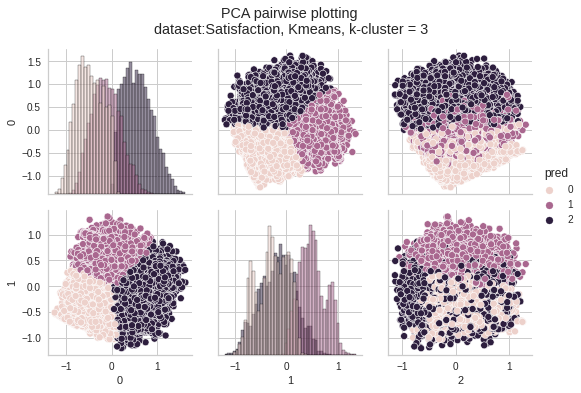

In [ ]:
plot_km_pairwise(X_pca_proj, 3, 'PCA pairwise plotting\n dataset:Satisfaction')

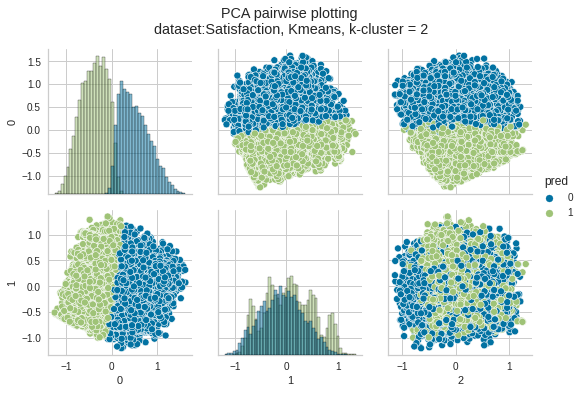

In [ ]:
plot_km_pairwise(X_pca_proj, 2, 'PCA pairwise plotting\n dataset:Satisfaction')

### ICA

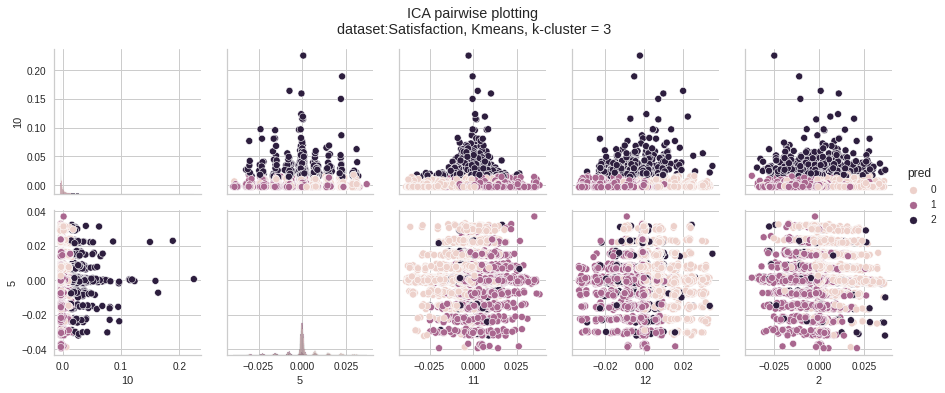

In [ ]:
plot_km_pairwise(X_ica_proj, 3, 'ICA pairwise plotting\n dataset:Satisfaction')

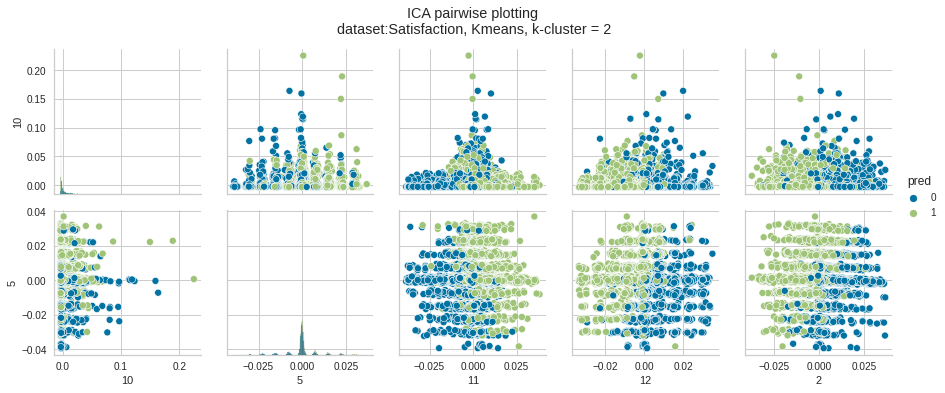

In [ ]:
plot_km_pairwise(X_ica_proj, 2, 'ICA pairwise plotting\n dataset:Satisfaction')

### RP

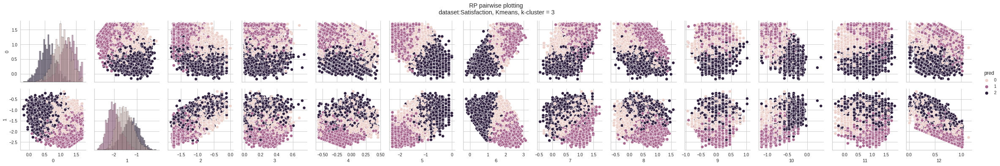

In [ ]:
plot_km_pairwise(X_rp_proj[0], 3, 'RP pairwise plotting\n dataset:Satisfaction')

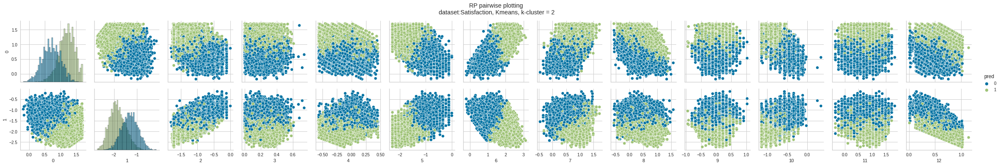

In [ ]:
plot_km_pairwise(X_rp_proj[0], 2, 'RP pairwise plotting\n dataset:Satisfaction')

### RFC

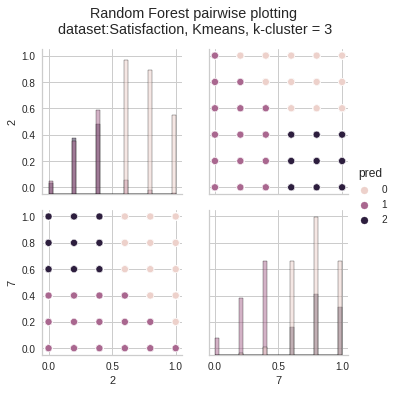

In [ ]:
plot_km_pairwise(X_rfc_proj, 3, 'Random Forest pairwise plotting\n dataset:Satisfaction')

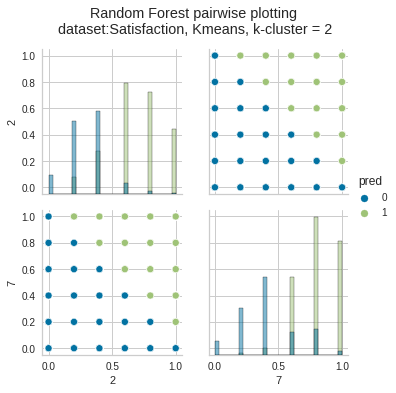

In [ ]:
plot_km_pairwise(X_rfc_proj, 2, 'Random Forest pairwise plotting\n dataset:Satisfaction')

##EM with projections

In [ ]:
print("Starting PCA scores")
scores_df_pca = get_em_scores(X_pca_proj, y_train, 10)

print("Starting ICA scores")
scores_df_ica = get_em_scores(X_ica_proj, y_train, 10)

scores_df_rp = []
for i in range(len(X_rp_proj)):
    print(f"Starting RP scores [{i}]")
    scores_df_rp.append(get_em_scores(X_rp_proj[i], y_train, 10))
print("Starting RFC scores")
scores_df_rfc = get_em_scores(X_rfc_proj, y_train, 10)

Starting PCA scores
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting ICA scores
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [0]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [1]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [2]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10
Starting RP scores [3]
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 1

In [ ]:
print("Starting RFC scores")
scores_df_rfc = get_em_scores(X_rfc_proj, y_train, 10)

Starting RFC scores
 done with N: 2
 done with N: 3
 done with N: 4
 done with N: 5
 done with N: 6
 done with N: 7
 done with N: 8
 done with N: 9
 done with N: 10


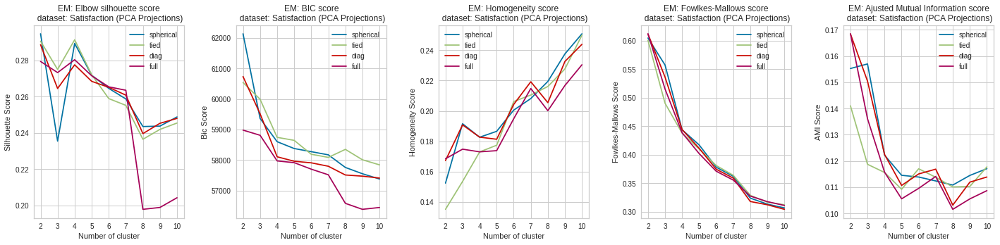

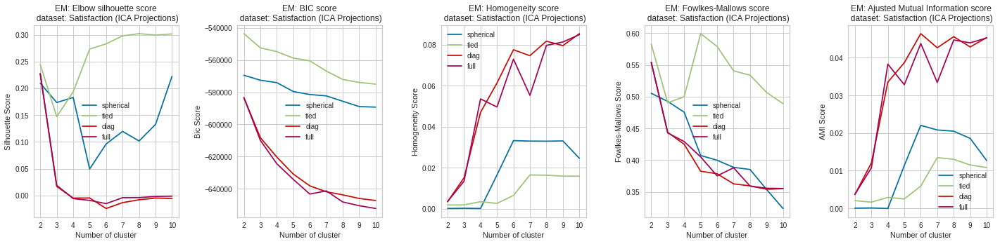

(9, 21), (9, 21)


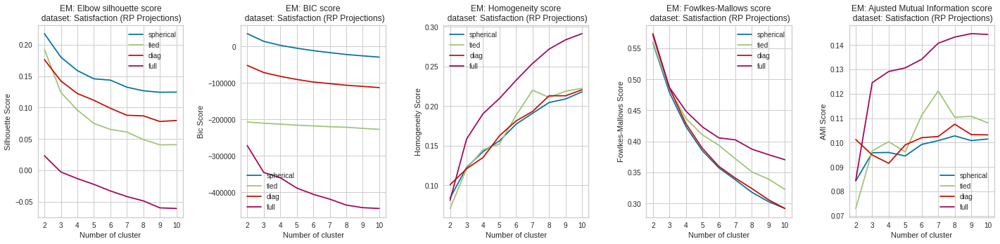

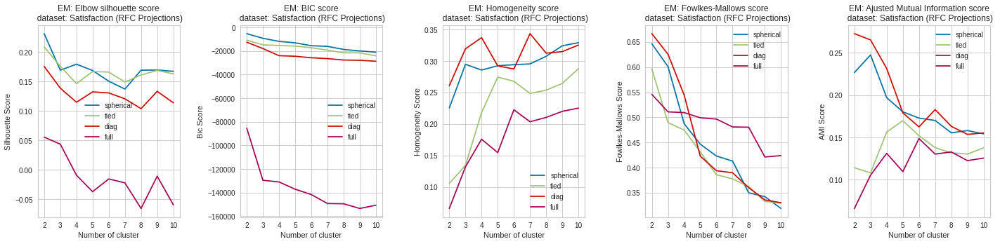

In [ ]:
plot_elbow_em(scores_df_pca, 'Satisfaction (PCA Projections)')#, face_color='#FF8C00')

plot_elbow_em(scores_df_ica, 'Satisfaction (ICA Projections)')#, face_color='#ffffd4')

scores_all_df_rp = merge_scores_df_list(scores_df_rp)
print(f"{scores_all_df_rp.shape}, {scores_df_rp[0].shape}")
plot_elbow_em(scores_all_df_rp, 'Satisfaction (RP Projections)')#, face_color='#f6cefc')

plot_elbow_em(scores_df_rfc, 'Satisfaction (RFC Projections)')#, face_color='#cafffb')


In [ ]:
def plot_em_pairwise(X, N, cv_type, title):
    
    gmm = GMM(n_components=N, covariance_type=cv_type, random_state=7)
    gmm.fit(X)
    pred_clusters = gmm.predict(X)


    filtred_df = pd.DataFrame(X)
 
    x_vars = filtred_df.columns    
    y_vars = filtred_df.columns[0:2]
    filtred_df['pred'] = pred_clusters

    ax = sns.PairGrid(filtred_df, hue="pred", x_vars=x_vars, y_vars=y_vars)
    ax.map_diag(sns.histplot)
    ax.map_offdiag(sns.scatterplot)
    ax.add_legend()
    ax.fig.suptitle("%s, EM, k-cluster = %d"%(title,N), y=1.08)

### PCA

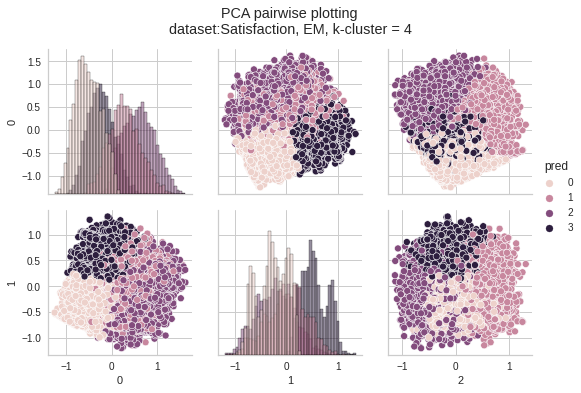

In [ ]:
plot_em_pairwise(X_pca_proj, 4, 'tied','PCA pairwise plotting\n dataset:Satisfaction')

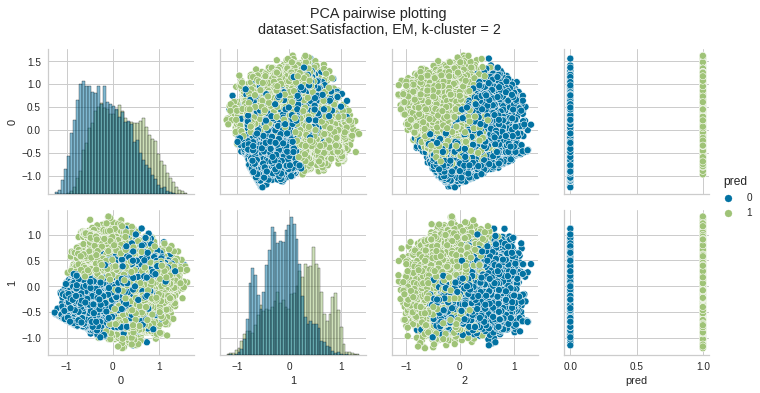

In [ ]:
plot_em_pairwise(X_pca_proj, 2, 'tied','PCA pairwise plotting\n dataset:Satisfaction')

### ICA

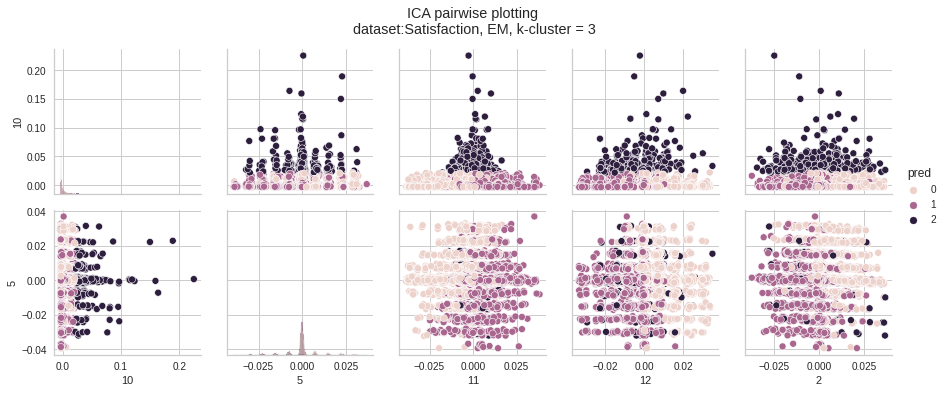

In [ ]:
plot_em_pairwise(X_ica_proj, 3, 'tied','ICA pairwise plotting\n dataset:Satisfaction')

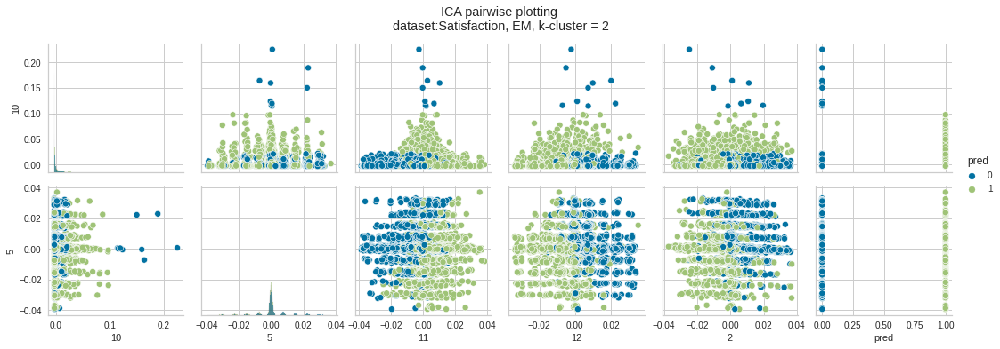

In [ ]:
plot_em_pairwise(X_ica_proj, 2, 'tied','ICA pairwise plotting\n dataset:Satisfaction')

### RP

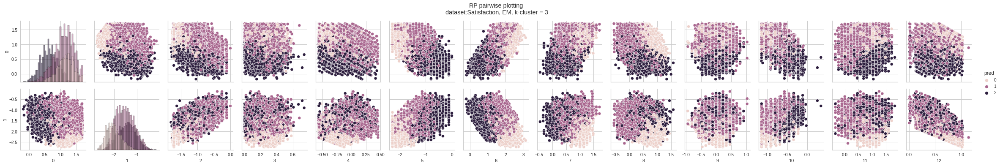

In [ ]:
plot_em_pairwise(X_rp_proj[0], 3, 'tied','RP pairwise plotting\n dataset:Satisfaction')

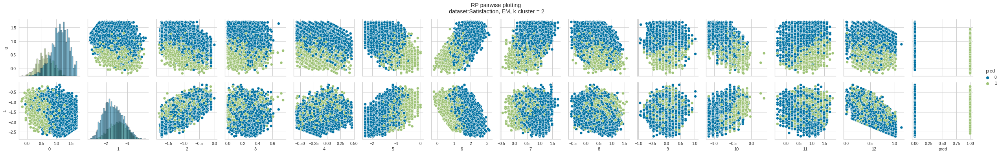

In [ ]:
plot_em_pairwise(X_rp_proj[0], 2, 'tied','RP pairwise plotting\n dataset:Satisfaction')

### RFC

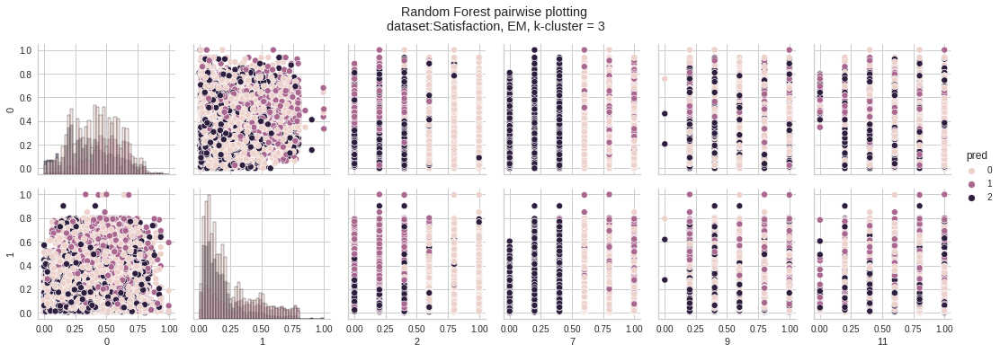

In [ ]:
plot_em_pairwise(X_rfc_proj, 3, 'tied','Random Forest pairwise plotting\n dataset:Satisfaction')

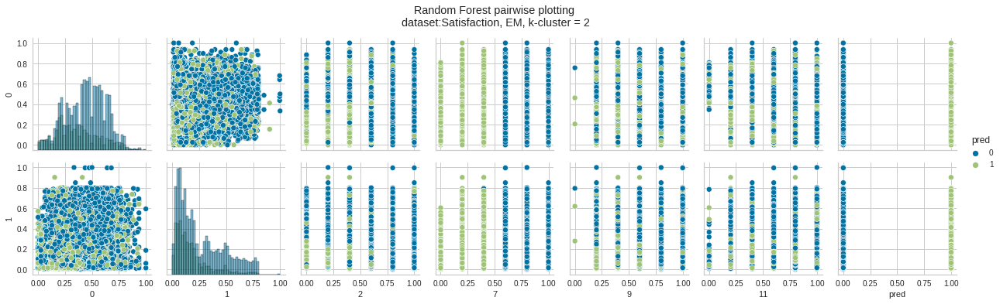

In [ ]:
plot_em_pairwise(X_rfc_proj, 2, 'tied','Random Forest pairwise plotting\n dataset:Satisfaction')